<a href="https://colab.research.google.com/github/Aute0/Py_for_analysis-/blob/main/9_AB_Lecture.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Проверка данных на нормальность



<a id="Libraries"></a>
##  Загрузка библиотек 

In [2]:

# import scipy.stats
# from scipy.stats import ttest_1samp
import numpy as np
import pandas as pd


from scipy.stats import norm, t, kstest, shapiro
import statsmodels.api as sm
from matplotlib import pyplot as plt


import warnings
warnings.filterwarnings('ignore')
warnings.warn('DelftStack')
warnings.warn('Do not show this message')



ModuleNotFoundError: No module named 'scipy'

In [ ]:
np.random.seed(17)

In [ ]:
# Создадим выборку нормального распределения и распределения Стьюдента с 5-ю степенями свободы.
# По форме они очень похожи..
x = norm.rvs(size = 250)
y = t.rvs(size = 250, df = 5)

In [ ]:
import plotly.express as px # Интерактивная библиотека для графиков.
# marginal = 'box' - указываем, чтобы вывел еще и boxplot

fig = px.histogram(y, x=y, title='y', marginal = 'box')
fig.show(renderer='colab')

In [ ]:
# Смотрим и для второго распределения x.
# Выглядит нормальным, но является ли нормальным - нужно выяснить.


fig = px.histogram(x, x=x, title='x', marginal = 'box')
fig.show(renderer='colab')

# Проверка на нормальность:

1) Графические: Оценка данных с использованием гистограммы и Quantile-Quantile-plot

2) Статистические: Критерии проверки нормальности распределения (Шапиро-Уилка при n < 5_000 и Колмогорова-Смирнова для любых выборок)

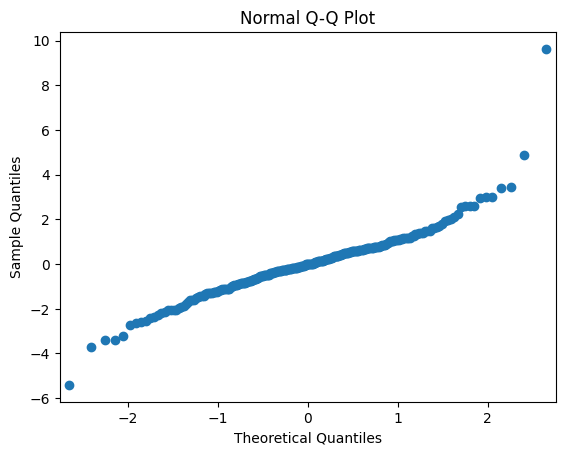

In [ ]:
# QQ-plot для x и для y

fig = sm.qqplot(y, color='green')
plt.title('Normal Q-Q Plot')
plt.show;

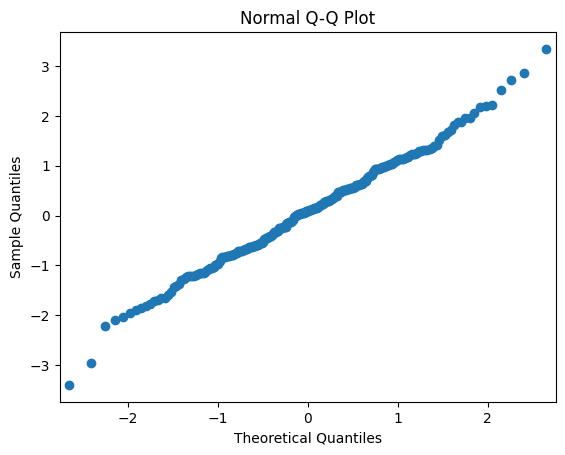

In [ ]:
fig = sm.qqplot(x, color='green')
plt.title('Normal Q-Q Plot')
plt.show;

# Тест Колмогорова-Смирнова - проверка на нормальность.

Для выборок любого размера.

$H_0$ - x взята из генеральной совокупности с нормальным распределением.

$H_1$ - x взята из ген.совокупности с другим распределением.

Можно использовать для проверки любого другого распределения(Стьюдента, биномиального, коши, экспоненциального).

**При p-value > alpha: анализируемое распределение не отличается от нормального.**


In [ ]:
# Проверим принадлежность выборок к нормальному распределению.

print(kstest(x, 'norm'))
print(kstest(y, 'norm'))

KstestResult(statistic=0.057424163162479946, pvalue=0.3678988921991774, statistic_location=-0.006456710309898987, statistic_sign=-1)
KstestResult(statistic=0.054751982840907654, pvalue=0.4266179885446888, statistic_location=-1.0927671816577422, statistic_sign=1)


---
По этим выборкам данные распределения не отличаются от нормального.

---

In [ ]:
# Проверим принадлежность к экспоненциальному распределению (сложная гипотеза):

print(kstest(x, 'expon'))

KstestResult(statistic=0.448, pvalue=2.739849972719059e-46, statistic_location=-0.0036960408325081625, statistic_sign=1)


In [ ]:
# Проверим принадлежность к биномиальному распределению (простая гипотеза)
# Требует уточнения параметров.

print(kstest(x, 'binom', args=(1_500, 0.16)))

KstestResult(statistic=1.0, pvalue=0.0, statistic_location=3.3451573949029427, statistic_sign=1)


---
Наше распределение точно отличается от экспоненциального и от биномиального

---

# Проверка на нормальность Шапиро-Уилка:

Является наиболее мощным для воборок до 5_000 наблюдений.

$H_0$ - x взята из генеральной совокупности с нормальным распределением.

$H_1$ - x взята из ген.совокупности с другим распределением.

**При p-value > alpha: анализируемое распределение не отличается от нормального.**

In [ ]:
w, p_val = shapiro(x)
print('Shapiro-Wilk normality test for x')
print('---' * 10)
print('w =', w)
print('p-value =', p_val)

Shapiro-Wilk normality test for x
------------------------------
w = 0.9963920712471008
p-value = 0.8381169438362122


---
Распределение x не отличается от нормального. 

p-value > alpha

---

In [ ]:
w, p_val = shapiro(y)
print('Shapiro-Wilk normality test for x')
print('---' * 10)
print('w =', w)
print('p-value =', p_val)

Shapiro-Wilk normality test for x
------------------------------
w = 0.9189559817314148
p-value = 2.0091221741846965e-10


---
Тест Колмагорова-Смирнова показал, что оба распределения нормальные.

НО!!! тест Шапиро-Уилка является более мощным на выборках до 5_000 => он и выявил, то распределение y отличается от нормального. (Мы как раз и получили его как распределение t-Стьюдента)

# Расчет мощности теста / расчет длительности эксперимента.



### Факторы, влияющие на мощность теста:
1) ***статистические:*** 
- Размер выбора(effect_size, ошибка 1 рода, ошибка 2 рода)
- Дисперсия (дисперсия частично зашита в effect_size => чем больше дисперсия, тем больше нам нужно наблюдений)

2) ***продуктовые:***
- Сезонность(недельная/месячная...)
- Метрика (тип метрики, окно закрытия метрики)



In [ ]:
import math
import numpy as np
import statsmodels.stats.power as smp
from tqdm.auto import tqdm  # будет показывать количество итераций
import matplotlib.pyplot as plt
import seaborn as sns       # библиотека для визуализаций

In [ ]:
plt.style.use('ggplot')

In [ ]:
# Критерий пропорций (для кликов, конверсий)

alpha = 0.05
power = 0.9
n = 450             # Количество наблюдений.
p_x = 0.5           # Конверсии.
p_y = 0.6

In [ ]:
# effect_size

h = 2 * math.asin(np.sqrt(p_x)) - 2 * math.asin(np.sqrt(p_y))
h

-0.20135792079033066

# Test Procedure

If we assume that $P_1$ and $P_2$ represents the two proportions. The effect_size is represented as this difference:

$h = φ_1 - φ_2 $, where $φ = arcsine(\sqrt{P_i})$

In [ ]:
# Мощность критерия для выборки из n элементов, если effect_size = h, alpha = 5%

power = smp.zt_ind_solve_power(effect_size=h, nobs1=n, alpha=alpha, alternative='two-sided')
power

0.8555200838742346

In [ ]:
# Количество наблюдений, необходимое для заданного эффекта при alpha=5%, beta(power)=80%

smp.zt_ind_solve_power(effect_size=h, alpha=alpha, power=power, alternative='two-sided')

449.9999999951084

In [ ]:
# Величина эффекта effect_size при заданных alpha и beta

smp.zt_ind_solve_power(nobs1=n, alpha=alpha, power=power)

0.20135582707747696

In [ ]:
effects = []
sample_sizes = []

for i in tqdm(range(10, 10_000)):
  effects.append(smp.tt_ind_solve_power(nobs1=i, alpha=alpha, power=power))
  sample_sizes.append(i)

  0%|          | 0/9990 [00:00<?, ?it/s]

In [ ]:
df = pd.DataFrame({'effects': effects, 'sample_sizes': sample_sizes})
df

,effects,sample_sizes
0,1.428738,10
1,1.354278,11
2,1.290467,12
3,1.234970,13
4,1.186115,14
...,...,...
9985,0.042727,9995
9986,0.042725,9996
9987,0.042723,9997
9988,0.042721,9998


In [ ]:
import plotly.express as px

fig = px.line(df, x='sample_sizes', y='effects', title='effect vs sample size')
fig.show(renderer='colab')

---
Чем меньше эффект, тем больше нам нужно количество наблюдений, чтобы его зафиксировать.

---

In [ ]:
power = []
sample_sizes = []

for i in tqdm(range(10, 10_000)):
  power.append(smp.tt_ind_solve_power(nobs1=i, alpha=alpha, effect_size=0.1))
  sample_sizes.append(i)

  0%|          | 0/9990 [00:00<?, ?it/s]

In [ ]:
df2 = pd.DataFrame({'power': power, 'sample_sizes': sample_sizes })
df2

,power,sample_sizes
0,0.055161,10
1,0.055741,11
2,0.056320,12
3,0.056899,13
4,0.057479,14
...,...,...
9985,1.000000,9995
9986,1.000000,9996
9987,1.000000,9997
9988,1.000000,9998


In [ ]:
fig = px.line(df2, x='sample_sizes', y='power', title='power vs sample size')
fig.show(renderer='colab')

---
При росте количества наблюдений, мощность увеличивается.

---

# Множественная проверка гипотез

In [ ]:
import numpy as np
import matplotlib.pyplot as  plt
from scipy import stats

rvs_1 = stats.norm.rvs(loc=5, scale=10, size=1_000, random_state=0)
rvs_2 = stats.norm.rvs(loc=6.5, scale=8, size=1_000, random_state=0)

In [ ]:
def t_test_function(rvs, alpha, no_test):   # на вход: распределение, альфу и количество тестов.
  counter=0
  for i in range(no_test):
    rvs_random = stats.norm.rvs(loc=5, scale=10, size=1_000, random_state=i+1)

    statistic, pvalue = stats.ttest_ind(rvs, rvs_random, equal_var=False)

    if pvalue <= alpha:
      counter += 1

  print(counter)

In [ ]:
# поправка Бонферони: альфа / на количество попарных сравнений.

[An overview of the Multiple Comparison problem](https://towardsdatascience.com/an-overview-of-the-multiple-comparison-problem-166aa5fcaac5)

In [ ]:
def bonferroni_correction_function(rvs, alpha, no_test):
  alpha_bonferroni = alpha / no_test

  counter = 0
  for i in range(no_test):
    rvs_random = stats.norm.rvs(loc=5, scale=10, size=1_000, random_state=i+1)

    statistic, pvalue = stats.ttest_ind(rvs, rvs_random, equal_var=False)

    if pvalue <= alpha_bonferroni:
      counter += 1

  print(counter)

In [ ]:
t_test_function(rvs_1, alpha=0.05, no_test=100)
t_test_function(rvs_2, alpha=0.05, no_test=100)

bonferroni_correction_function(rvs_1, alpha=0.05, no_test=100)

bonferroni_correction_function(rvs_2, alpha=0.05, no_test=100)

11
85
0
18


---
В 0 раз - отличается статистически значимая разница. Поправка Бонферони понижает риск False Positive.

---


# Bootstrap.

In [ ]:
!pip install bootstrapped

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Preparing metadata (setup.py) ... done
  Created wheel for bootstrapped: filename=bootstrapped-0.0.2-py2.py3-none-any.whl size=13953 sha256=c6e4ead14f6cb4b2276831b9e3e60c366a5b1ac7cfa506f2ecbe37156be84dec
  Stored in directory: /root/.cache/pip/wheels/a9/7b/e9/000ad8cb18a35a7d68051b362c96a867cd24b7b0c7b478329d
Successfully built bootstrapped


In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import norm
import matplotlib.pyplot as plt

from tqdm.auto import tqdm

import bootstrapped.bootstrap as bs
import bootstrapped.compare_functions as bs_compare
import bootstrapped.stats_functions as bs_stats


[GitHub - facebookarchive/bootstrapped: Generate bootstrapped confidence intervals for A/B testing in Python.](https://github.com/facebookarchive/bootstrapped)

In [ ]:
plt.style.use('ggplot')

In [ ]:
n = 11_000
sample_A = np.random.exponential(scale=1/0.002, size=n)
sample_B = np.random.exponential(scale=1/0.00201, size=n)

df = pd.DataFrame({"sample_A": sample_A, "sample_B": sample_B})

In [ ]:
s_1 = df.sample_A.values

s_2 = df.sample_B.values

b = bs.bootstrap_ab(s_1, s_2, stat_func=bs_stats.mean,
                    compare_func=bs_compare.difference, alpha=0.05, num_iterations=10_000)

print(b.lower_bound, b.upper_bound)

-13.575697117009774 12.542098662542871


In [ ]:
# Для стандартного отклонения

v = bs.bootstrap_ab(s_1, s_2, stat_func=bs_stats.std, 
                    compare_func=bs_compare.difference, alpha=0.05, num_iterations=10_000)

print(v.lower_bound, v.upper_bound)

-20.442240280959 16.275232624979612


# Бакетирование.

---
разбивает данные на более управляемые части (сегменты или бакеты), чтобы ускорить последовательные чтения данных для последующих заданий. В один бакет попадают строчки таблицы, у которых совпадает значение хэш-функции, вычисленное по определенной колонке.

Способ привести распределение к нормальному и применить, например, ttest.

### Когда чего применяем:
- сохранить информацию о дисперсии и среднем в выборке до трансформации.
- привести к нормальному распределению.

---
Возьмем кратное количество групп: например, 2_000 (можно 300 или 600)

In [ ]:
plt.style.use('ggplot')

In [ ]:
b = 2_000
n = 200_000

val_A = np.random.exponential(scale=1/0.002, size=n)
val_B = np.random.exponential(scale=1/0.00201, size=n) 

sample_exp = pd.DataFrame({
    "metric": np.concatenate([val_A, val_B]),
    "group": ["A" for i in range(n)] + ["B" for i in range(n)],
    "bucket": [i for i in range(b)] * int(n * 2 / b)
})

In [ ]:
# Агрегация по бакетам и считаем среднее.

backeted_df = sample_exp.groupby(by=["bucket", "group"])["metric"].agg(mu=np.mean, sd_mu=np.std).reset_index()
backeted_df.head()

,bucket,group,mu,sd_mu
0,0,A,499.818208,464.306970
1,0,B,426.182624,475.108243
2,1,A,616.961489,632.836879
3,1,B,424.437485,415.237669
4,2,A,450.873451,511.935243


In [ ]:
# Сравним выборочное среднее и среднее по баккетам изначальное.

round(np.mean(sample_exp["metric"]), 3) == round(np.mean(backeted_df["mu"]), 3)

True

In [ ]:
np.var(sample_exp["metric"]) / len(sample_exp["metric"])


0.62022836312242

In [ ]:
np.var(backeted_df["mu"]) / len(backeted_df["mu"])

0.6229164796138839

In [ ]:
sample_exp

,metric,group,bucket
0,611.011601,A,0
1,203.099276,A,1
2,168.803580,A,2
3,159.956112,A,3
4,512.569212,A,4
...,...,...,...
399995,190.374082,B,1995
399996,214.444535,B,1996
399997,134.786448,B,1997
399998,617.745418,B,1998


In [ ]:
import plotly.express as px

fig = px.histogram(sample_exp, x=sample_exp.metric, title='x', marginal='box')
fig.show(renderer="colab")